In [1]:
import csv
import json
import numpy as np
import pandas as pd

import folium
import branca
import branca.colormap as cmp

import matplotlib.pyplot as plt

city_geo = json.load(open("cities.geojson"))

base_tiles = pd.read_csv("/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_2021-07-04_1600.csv")

KSH = pd.read_csv("/mnt/epmat/KSH/HU_places_admin_pop_ZIP_latlon.csv")

In [2]:
import os
def get_weekly_aggregation(days, df, ind, col="n_crisis"):
    week = None
    for date in days:
        df1 = pd.read_csv(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{date}_0000.csv")
        df2 = pd.read_csv(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{date}_0800.csv")
        df3 = pd.read_csv(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{date}_1600.csv")
        
        week = pd.concat((week, df1, df2, df3))
    
    df[str(ind)]=week.groupby(["polygon_name"]).mean()[col]
    #df[str(ind)+"_std"]=week.groupby(["polygon_name"]).std()["n_crisis"]
    return df

def get_weeks():
    days = []
    for year,m1,m2 in [(2020,6,12), (2021,1,12), (2022,1,3)]:
        for m in range(m1,m2+1):
            y0 = []
            for day in range(1,31):
                time="0000"
                if(os.path.exists(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{year}-{m:02d}-{day:02d}_{time}.csv")):
                    days.append(f"{year}-{m:02d}-{day:02d}")
    
    #return np.array(days).reshape((-1))
    return np.array(days).reshape((-1, 7))


In [3]:
base_tiles;

# Percent change in city populations

In [4]:
import branca
import requests

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=-30, vmax=100,index=[-30.0, 0.0, 50.0],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

df = pd.DataFrame()
city_series = get_weekly_aggregation([f"2020-07-{i:02d}" for i in range(1, 31)], df, 0, col="percent_change"). \
    to_dict()['0']
#city_series = base_tiles.set_index("polygon_name").to_dict()["percent_change"]


def style_function(feature):
    change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    #change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = '2020-07 % change in city populations'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))


folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

In [5]:
import branca
import requests

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=-30, vmax=100,index=[-30.0, 0.0, 50.0],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

df = pd.DataFrame()
city_series = get_weekly_aggregation([f"2020-12-{i:02d}" for i in range(1, 31)], df, 0, col="percent_change"). \
    to_dict()['0']
#city_series = base_tiles.set_index("polygon_name").to_dict()["percent_change"]


def style_function(feature):
    change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    #change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = '2020-12 % change in city populations'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

In [6]:
import branca
import requests

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=-30, vmax=100,index=[-30.0, 0.0, 50.0],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

df = pd.DataFrame()
city_series = get_weekly_aggregation([f"2021-04-{i:02d}" for i in range(1, 31)], df, 0, col="percent_change"). \
    to_dict()['0']
#city_series = base_tiles.set_index("polygon_name").to_dict()["percent_change"]


def style_function(feature):
    change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    #change = city_series[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in city_series else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = '2021-04 % change in city populations'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

In [7]:
max(city_series.values())

183.3338040877077

# Facebook users in total

Text(0, 0.5, 'Users')

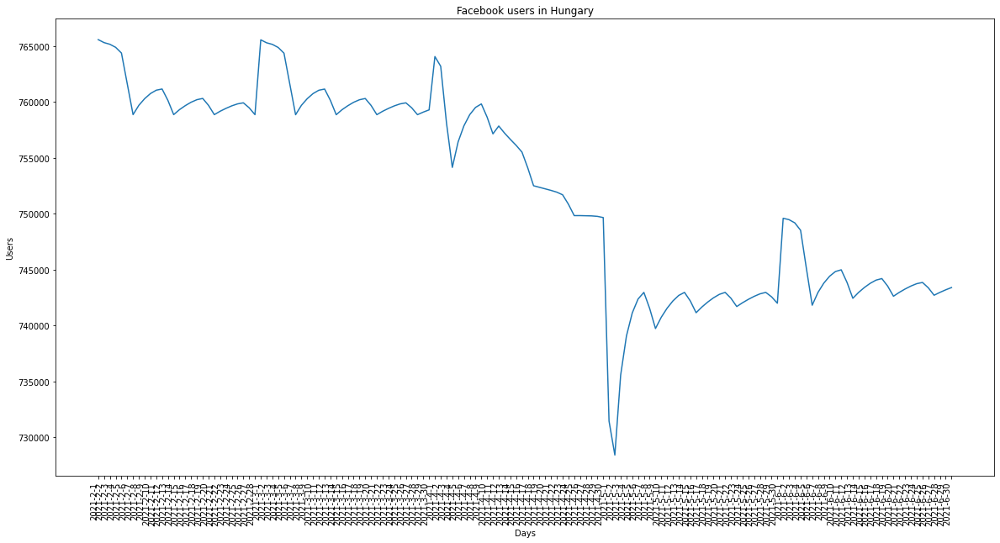

In [8]:

x = []
y= []
for year,m1,m2 in [(2021,2,6)]:
    for m in range(m1,m2+1):
        y0 = []
        for day in range(1,31):
            if(os.path.exists(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{year}-{m:02d}-{day:02d}_0000.csv")):
                tiles = pd.read_csv(f"/mnt/epmat/FB/Facebook_Population_Admin_Level4/Pop/11141643786132357_{year}-{m:02d}-{day:02d}_0000.csv")
                tiles=tiles[tiles["country"]=="HU"]
                y0.append(tiles["n_baseline"].sum())
                y.append(np.mean(y0))
                x.append(f"{year}-{m}-{day}")

plt.figure(figsize=(20,10))
plt.plot(range(len(x)),y)
plt.xticks(range(len(x)), labels=x, rotation=90, ha='right');
plt.title("Facebook users in Hungary")
plt.xlabel("Days")
plt.ylabel("Users")

# Facebook users in cities

In [5]:
# TODO
# color animation of the city change [weekly]

In [11]:
# === Weekly aggregation ===
df = pd.DataFrame()
week_begin = []
for i,week in enumerate(get_weeks()):
    df = get_weekly_aggregation(week, df, i)
    week_begin.append(week[0])
df

,0,1,2,3,4,5,6,7,8,9,...,83,84,85,86,87,88,89,90,91,92
Aba,355.428571,349.000000,350.285714,350.619048,349.238095,343.380952,335.571429,351.142857,350.428571,342.761905,...,326.142857,322.380952,322.238095,324.619048,322.523810,317.809524,313.047619,326.809524,316.523810,317.904762
Abaliget,46.000000,51.571429,53.523810,57.761905,55.333333,59.333333,63.571429,65.904762,69.571429,65.000000,...,31.285714,32.190476,34.142857,33.047619,34.142857,35.714286,32.476190,38.095238,34.761905,38.571429
Abasár,225.619048,235.619048,228.047619,233.714286,231.619048,228.190476,228.714286,234.714286,233.428571,227.047619,...,219.238095,213.904762,218.047619,212.333333,211.904762,208.285714,199.857143,215.619048,204.047619,205.666667
Abaújalpár,2.238095,2.428571,1.238095,2.047619,1.190476,0.952381,1.476190,1.333333,1.904762,2.666667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Abaújkér,38.238095,39.333333,39.476190,44.047619,41.666667,41.666667,44.095238,41.714286,41.047619,45.571429,...,32.428571,33.190476,35.285714,34.047619,29.809524,31.333333,31.428571,36.047619,33.380952,32.380952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Žitište,41.809524,35.714286,37.523810,36.714286,35.476190,36.238095,38.857143,38.809524,38.666667,39.619048,...,29.952381,27.666667,28.571429,27.952381,25.523810,26.666667,26.190476,30.333333,27.238095,28.952381
Žitná - Radiša,14.714286,17.619048,14.619048,14.333333,16.047619,17.285714,15.190476,13.952381,13.095238,13.904762,...,14.555556,14.666667,13.650000,14.631579,13.666667,14.533333,13.937500,13.000000,14.111111,14.352941
Žlkovce,22.380952,25.190476,23.095238,24.523810,22.476190,23.904762,27.238095,24.238095,25.047619,22.666667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Župkov,29.809524,27.333333,28.190476,29.095238,29.666667,30.000000,27.904762,25.428571,27.714286,24.904762,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Time dependency

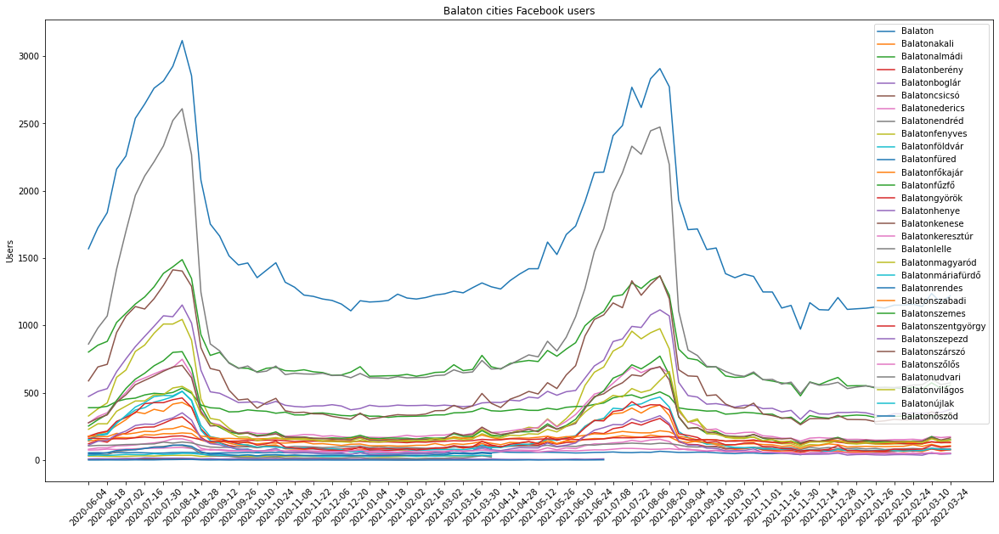

In [21]:
plt.figure(figsize=(20,10))
iter0 = df.iterrows()

for i in range(len(df)):
    name, x = next(iter0)
    if name[:7]=="Balaton":
        plt.plot(range(len(x)), x, label=name)

plt.title("Balaton cities Facebook users")
plt.xticks(range(0, len(week_begin), 2), week_begin[::2], rotation=45)
plt.ylabel("Users")
plt.legend();

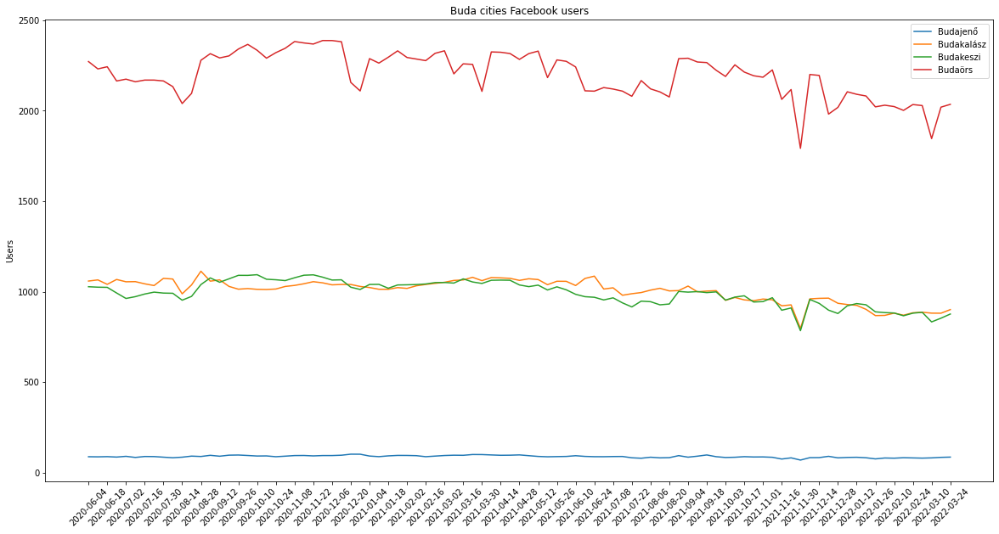

In [20]:
plt.figure(figsize=(20,10))
iter0 = df.iterrows()

for i in range(len(df)):
    name, x = next(iter0)
    if name[:4]=="Buda":
        if (name=="Budapest"): continue
        plt.plot(range(len(x)), x, label=name)

plt.title("Buda cities Facebook users")
plt.xticks(range(0, len(week_begin), 2), week_begin[::2], rotation=45)
plt.ylabel("Users")
plt.legend();

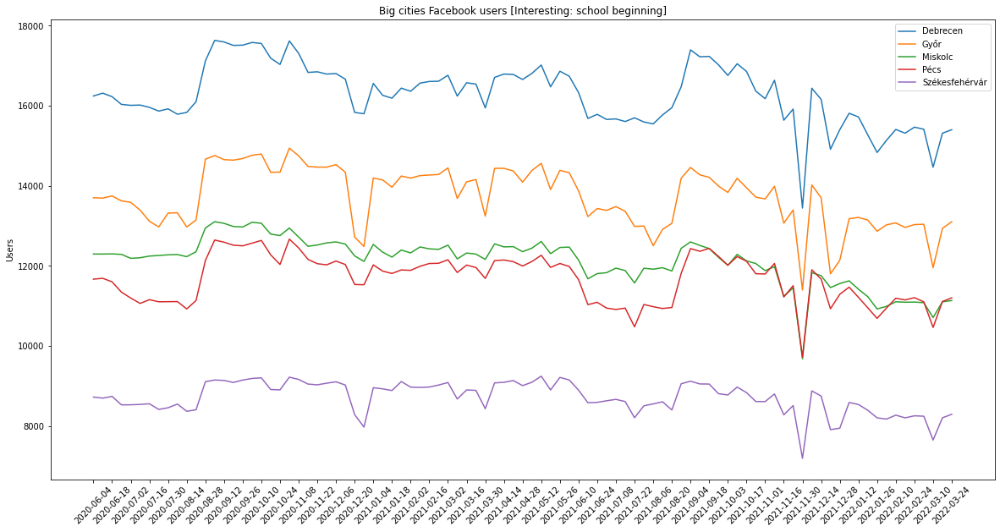

In [19]:
plt.figure(figsize=(20,10))
iter0 = df.iterrows()

for i in range(len(df)):
    name, x = next(iter0)
    if name in ["Miskolc", "Győr", "Debrecen", "Pécs", "Székesfehérvár"]:
        plt.plot(range(len(x)), x, label=name)

plt.title("Big cities Facebook users [Interesting: school beginning]")
plt.xticks(range(0, len(week_begin), 2), week_begin[::2], rotation=45)
plt.ylabel("Users")
plt.legend();

## Population dependency

[786214.40942524]
[[1.         0.02320705]
 [0.02320705 1.        ]]


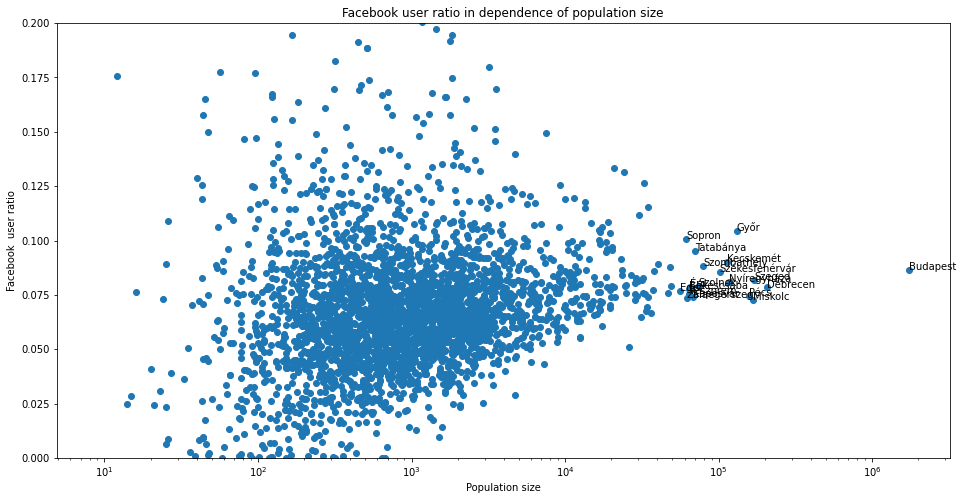

In [27]:
city_users = df.mean(1).to_dict()
pops = KSH.set_index("place")["population"]
user_ratio = {k:u/pops[k] for k,u in city_users.items() if k in pops}


arr = np.array([(users/pops[city],pops[city]) for city,users in city_users.items() if city in pops])


# === PLOT ===
plt.figure(figsize=(16,8))

plt.scatter(arr[:,1], arr[:, 0])
for city, users in city_users.items():
    if((city in pops) and (pops[city]>50000)):
        plt.gca().annotate(str(city), (pops[city], users/pops[city]))

plt.xscale("log")
plt.ylim([0,0.2])
plt.xlabel("Population size")
plt.ylabel("Facebook  user ratio")
plt.title("Facebook user ratio in dependence of population size");


print(np.correlate(arr[:,0], arr[:,1]))
print(np.corrcoef(arr.T))
# TODO gynege korreláció?

## Users spacial spreading

In [22]:
import branca
import requests

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.2,index=[0.0, 0.075, 0.14],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

city_users = df.mean(1).to_dict()
pops = KSH.set_index("place")["population"]
user_ratio = {k:u/pops[k] for k,u in city_users.items() if k in pops}

def style_function(feature):
    change = user_ratio[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in user_ratio else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'FB User ratio (in %) in city'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

# Commuting

In [6]:
import matplotlib.pyplot as plt

In [10]:
move = pd.read_csv('/mnt/epmat/FB/Movements_Between_Admin_HU_Level4/Move/3997476161380026_2021-10-05_1600.csv')

bp = move[np.logical_and(move["start_polygon_name"]=="Budapest", move["n_baseline"].notna())]
bp = bp[bp["end_polygon_name"]!="Budapest"]
segments = np.array(bp[["start_lat", "start_lon", "end_lat", "end_lon"]]).reshape(-1, 2,2)
weights = bp["n_crisis"]
colormap = plt.cm.Reds

In [12]:
bp.sort_values("n_crisis")[["n_crisis", "end_polygon_name"]][-20:]

,n_crisis,end_polygon_name
8425,276.0,Pomáz
13116,277.0,Taksony
11797,280.0,Gödöllő
10922,284.0,Veresegyház
8573,287.0,Budakalász
13835,298.0,Nagytarcsa
10845,310.0,Kerepes
13680,363.0,Szigethalom
8770,372.0,Göd
14035,409.0,Törökbálint


In [94]:
debrecen = move[np.logical_and(move["start_polygon_name"]=="Debrecen", move["n_baseline"].notna())]
debrecen.sort_values("n_crisis")[["n_crisis", "end_polygon_name"]][-20:]

,n_crisis,end_polygon_name
2522,13.0,Ebes
8308,19.0,Derecske
8524,22.0,Hajdúhadház
6836,23.0,Téglás
3571,31.0,Mikepércs
12054,31.0,Nyíregyháza
12711,41.0,Balmazújváros
9873,52.0,Hajdúszoboszló
5527,65.0,Hajdúsámson
9060,73.0,Hajdúböszörmény


In [15]:
debrecen = move[np.logical_and(move["start_polygon_name"]=="Debrecen", move["n_baseline"])]
debrecen

,geometry,date_time,start_polygon_id,start_polygon_name,end_polygon_id,end_polygon_name,length_km,tile_size,country,level,n_crisis,n_baseline,n_difference,percent_change,is_statistically_significant,z_score,start_lat,start_lon,end_lat,end_lon
1657,"LINESTRING (21.62109375 47.53127974061535, 21....",2021-10-05 16:00,356082,Debrecen,356923,Mikepércs,10.789613,13,HU,LEVEL4,119.0,95.2,23.8,24.740125,0.0,4.000000,47.530291,21.666023,47.432213,21.623817
2226,"LINESTRING (21.610107421875 47.53203614838088,...",2021-10-05 16:00,356082,Debrecen,356380,Nyírábrány,29.985573,13,HU,LEVEL4,NaN,NaN,NaN,106.896552,0.0,1.812587,47.530291,21.666023,47.555923,22.020407
2626,"LINESTRING (21.61845703125 47.528473625761166,...",2021-10-05 16:00,356082,Debrecen,356557,Ebes,11.912189,13,HU,LEVEL4,48.0,40.2,7.8,18.932039,0.0,0.850038,47.530291,21.666023,47.477769,21.498282
2842,"LINESTRING (21.64306640625 47.53203614838088, ...",2021-10-05 16:00,356082,Debrecen,356520,Hortobágy,36.865909,13,HU,LEVEL4,NaN,NaN,NaN,150.000000,0.0,4.000000,47.530291,21.666023,47.583700,21.123277
2969,"LINESTRING (21.59912109375 47.53203614838088, ...",2021-10-05 16:00,356082,Debrecen,356640,Hajdúszovát,19.265032,13,HU,LEVEL4,NaN,NaN,NaN,-23.913043,0.0,-0.964764,47.530291,21.666023,47.378735,21.456252
3251,"LINESTRING (21.59912109375 47.50235685339798, ...",2021-10-05 16:00,356082,Debrecen,356955,Bököny,28.141042,13,HU,LEVEL4,NaN,NaN,NaN,-47.368421,0.0,-0.593442,47.530291,21.666023,47.740813,21.744015
3399,LINESTRING (21.619096235795453 47.534732740013...,2021-10-05 16:00,356082,Debrecen,356177,Kaba,32.673812,13,HU,LEVEL4,NaN,NaN,NaN,220.754717,0.0,3.910879,47.530291,21.666023,47.362066,21.283366
3633,LINESTRING (21.626477778352648 47.540874634645...,2021-10-05 16:00,356082,Debrecen,356179,Hajdúhadház,14.510108,13,HU,LEVEL4,151.0,101.8,49.2,47.859922,0.0,3.308054,47.530291,21.666023,47.674793,21.674184
3958,"LINESTRING (21.62353515625 47.53203614838088, ...",2021-10-05 16:00,356082,Debrecen,356644,Nyírmártonfalva,22.249658,13,HU,LEVEL4,NaN,NaN,NaN,40.625000,0.0,0.599645,47.530291,21.666023,47.604934,21.888210
4114,"LINESTRING (21.64306640625 47.53203614838088, ...",2021-10-05 16:00,356082,Debrecen,356399,Pocsaj,29.576261,13,HU,LEVEL4,NaN,NaN,NaN,-42.857143,0.0,-0.884652,47.530291,21.666023,47.301193,21.827130


In [96]:
szeged = move[np.logical_and(move["start_polygon_name"]=="Szeged", move["n_baseline"].notna())]
szeged.sort_values("n_crisis")[["n_crisis", "end_polygon_name"]][-20:]

,n_crisis,end_polygon_name
4795,11.0,Szatymaz
4552,16.0,Zsombó
1875,19.0,Domaszék
1664,24.0,Deszk
6281,37.0,Röszke
7012,40.0,Mórahalom
1711,44.0,Makó
9024,46.0,Sándorfalva
2042,67.0,Algyő
7166,74.0,Hódmezővásárhely


In [17]:
list_colors = [
 "#00FF00", "#12FF00", "#24FF00", "#35FF00", "#47FF00", "#58FF00", "#6AFF00", "#7CFF00", "#8DFF00", "#9FFF00", "#B0FF00", "#C2FF00", "#D4FF00", "#E5FF00", "#F7FF00", "#FFF600", "#FFE400", "#FFD300", "#FFC100", "#FFAF00", "#FF9E00", "#FF8C00", "#FF7B00", "#FF6900", "#FF5700", "#FF4600", "#FF3400", "#FF2300", "#FF1100", "#FF0000",
]
color_dict = {i: list_colors[i] for i in range(len(list_colors))}
len(list_colors)

30

In [18]:
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.2,index=[0.0, 0.075, 0.14],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)

m = folium.Map(location=[47.49801,  19.03991], zoom_start=10, tiles="cartodbpositron",)

for (orig, dest),w in zip(segments, weights):
    folium.PolyLine(
        (orig, dest),
        color=color_dict[round(29*w/max(weights))],
        opacity =w/max(weights) 
    ).add_to(m)
m